In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
# Load dataset
file_path = "Road.csv"
df = pd.read_csv(file_path)

df["Time"] = pd.to_datetime(df["Time"], format="%H:%M:%S", errors="coerce")
df["Hour"] = df["Time"].dt.hour

df.drop(columns=["Time"], inplace=True)

df.fillna(df.mode().iloc[0], inplace=True)

In [ ]:
# Convert categorical columns to numerical
categorical_cols = df.select_dtypes(include=["object"]).columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le

# Selecting numerical columns for statistical analysis
numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns

In [ ]:
# Statistical Measures
stats = {
    "Mean": df[numerical_cols].mean(),
    "Standard Deviation": df[numerical_cols].std(),
    "Variance": df[numerical_cols].var(),
    "Skewness": df[numerical_cols].skew(),
    "Kurtosis": df[numerical_cols].kurt(),
}
stats_df = pd.DataFrame(stats)
print("\nStatistical Summary:\n", stats_df)


Statistical Summary:
                                  Mean  Standard Deviation   Variance  \
Day_of_week                  2.980513            2.059712   4.242414   
Age_band_of_driver           1.292952            1.337520   1.788959   
Sex_of_driver                0.957535            0.263767   0.069573   
Educational_level            3.208347            1.361538   1.853787   
Vehicle_driver_relation      0.333793            0.741375   0.549637   
Driving_experience           1.943732            1.236146   1.528056   
Type_of_vehicle              5.100357            4.548810  20.691673   
Owner_of_vehicle             2.693975            0.877637   0.770247   
Service_year_of_vehicle      3.532559            1.800526   3.241896   
Defect_of_vehicle            1.987983            0.133116   0.017720   
Area_accident_occured        6.439591            2.349455   5.519940   
Lanes_or_Medians             2.946736            1.716511   2.946412   
Road_allignment              4.930091    

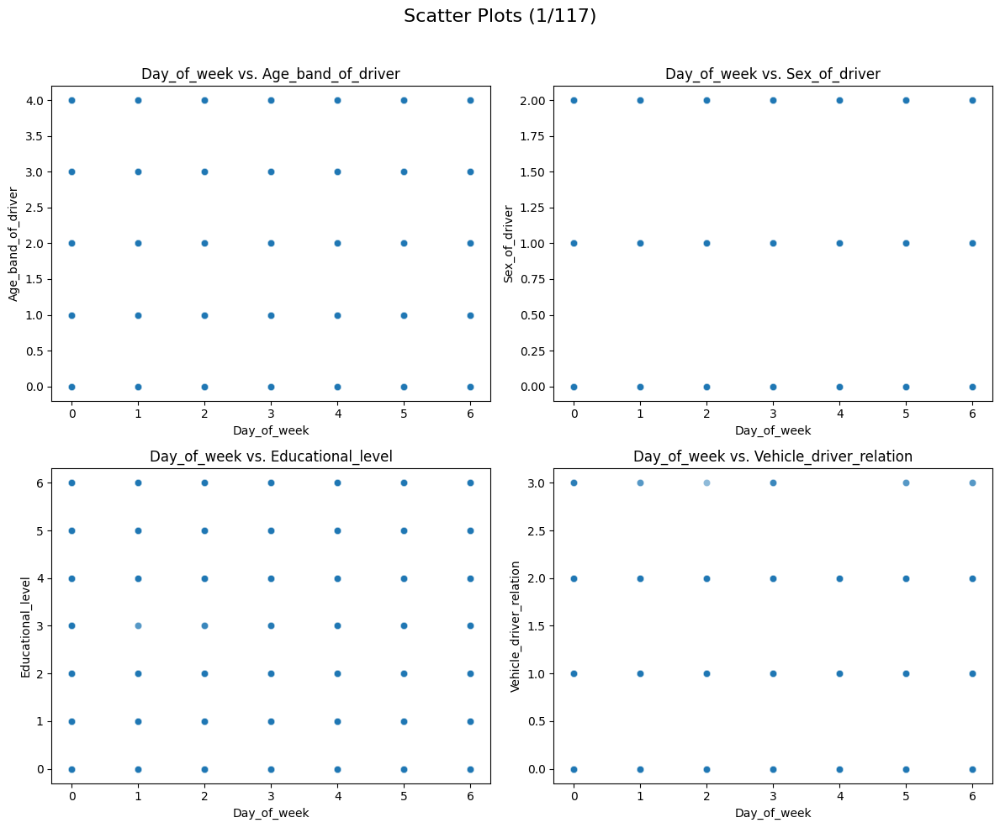

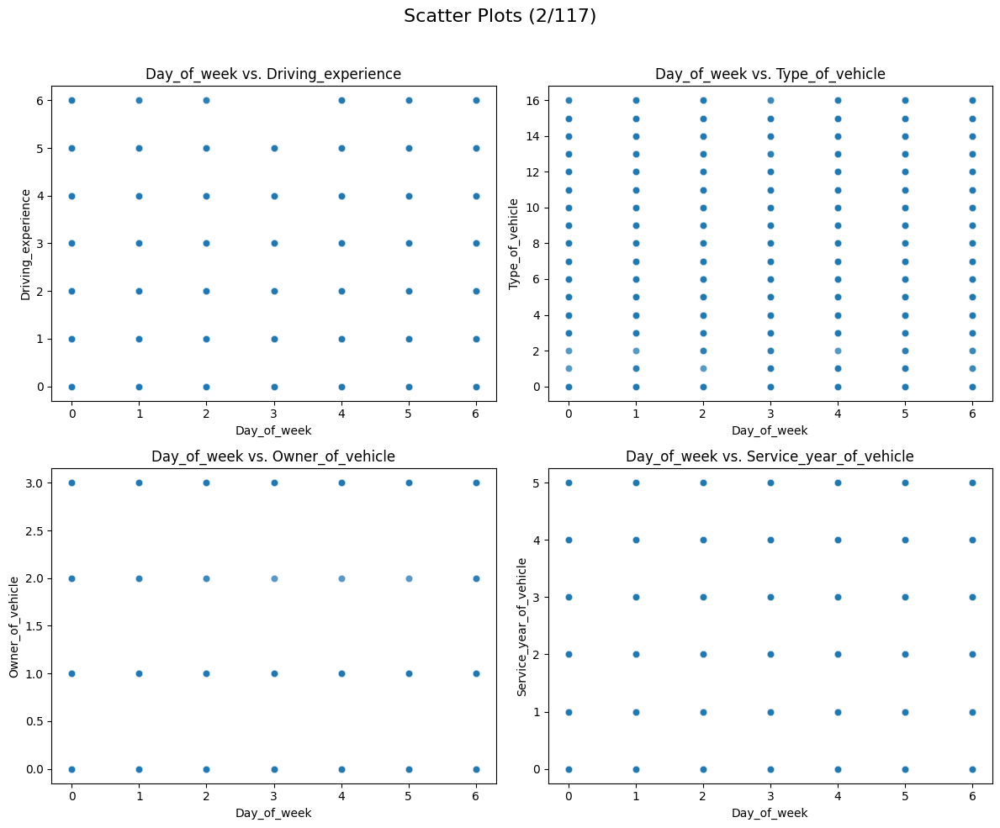

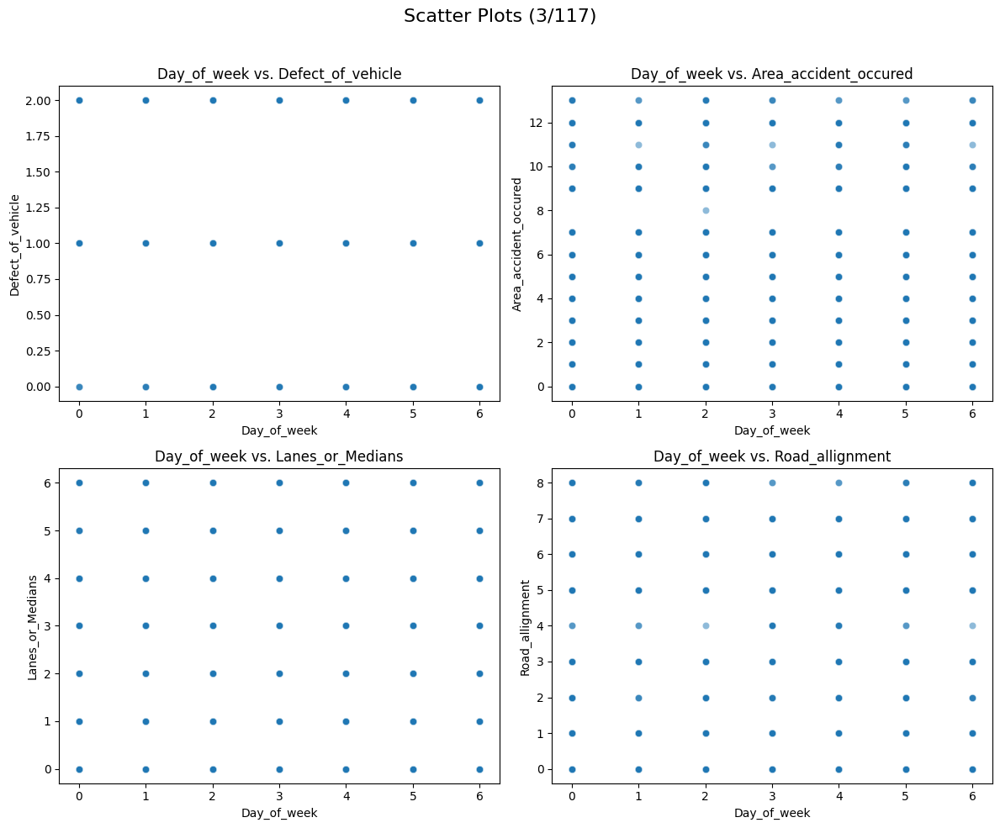

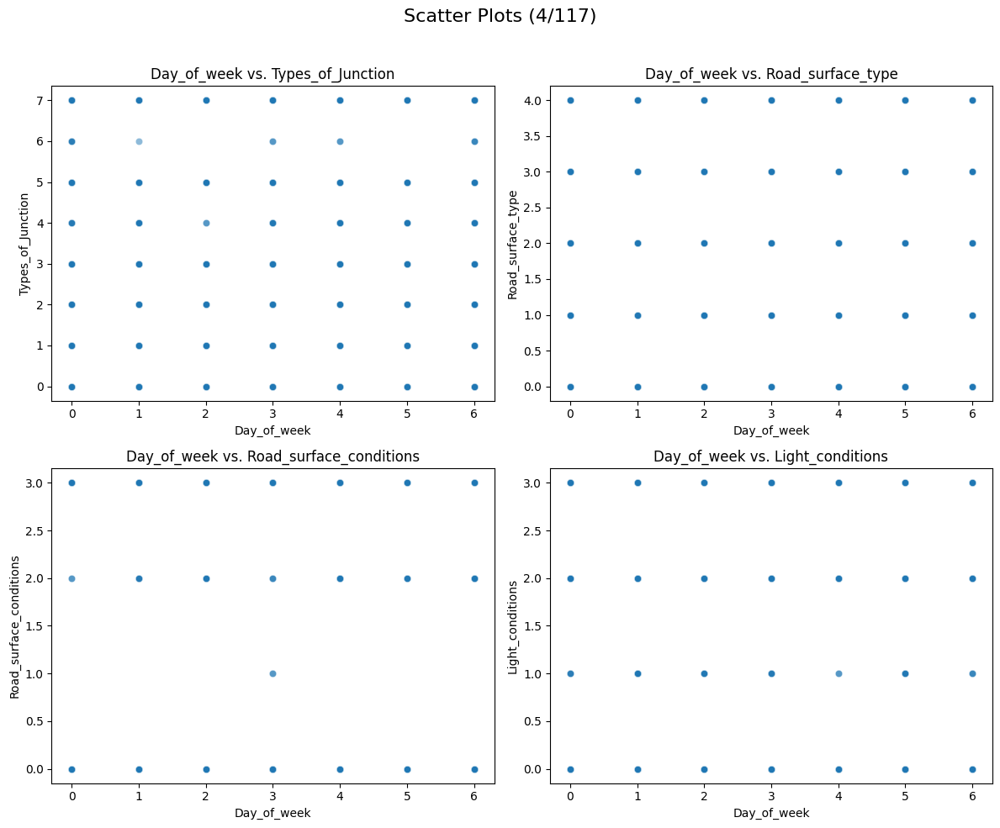

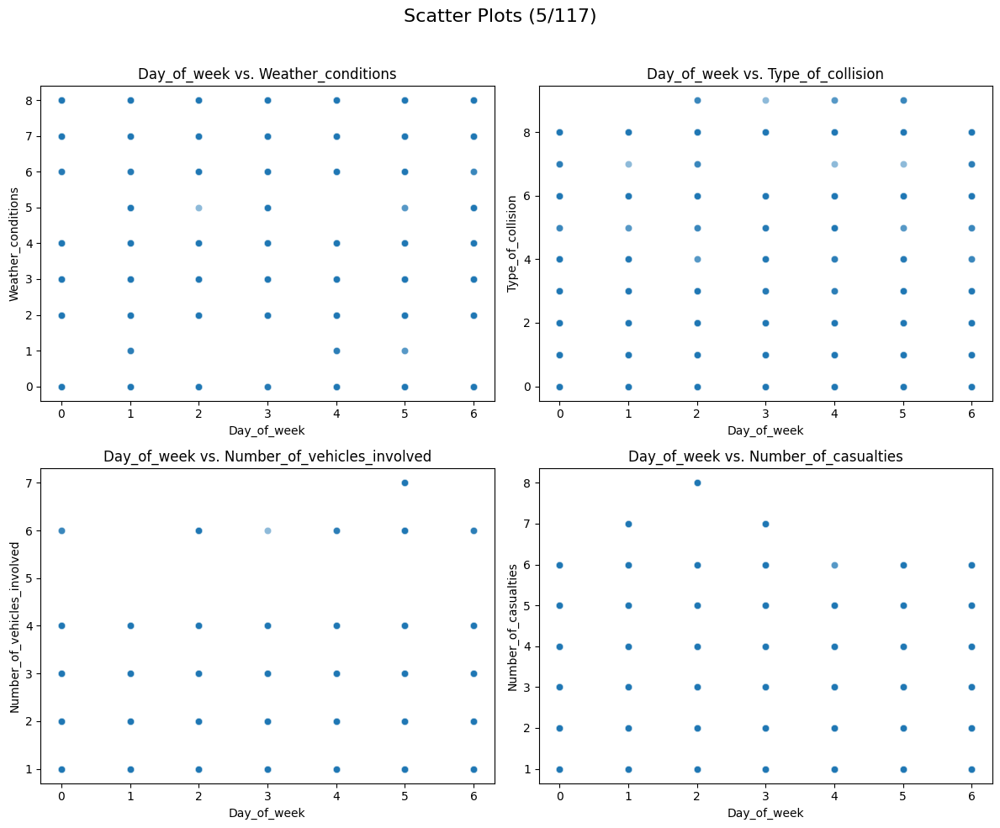

...

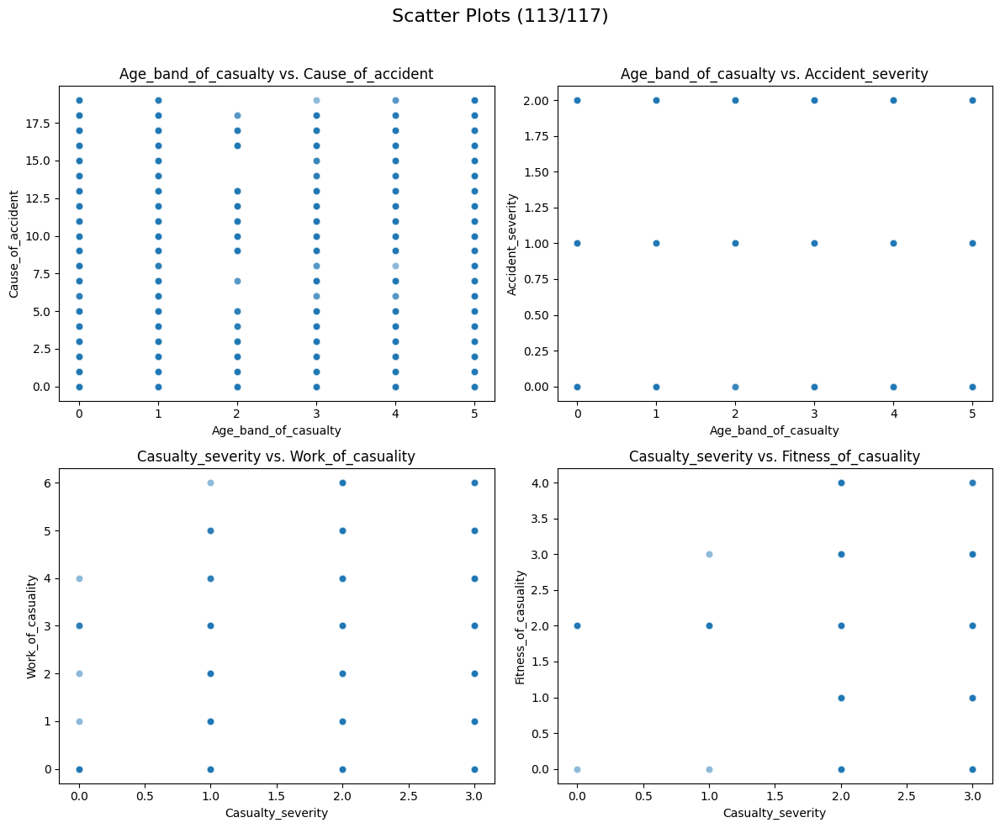

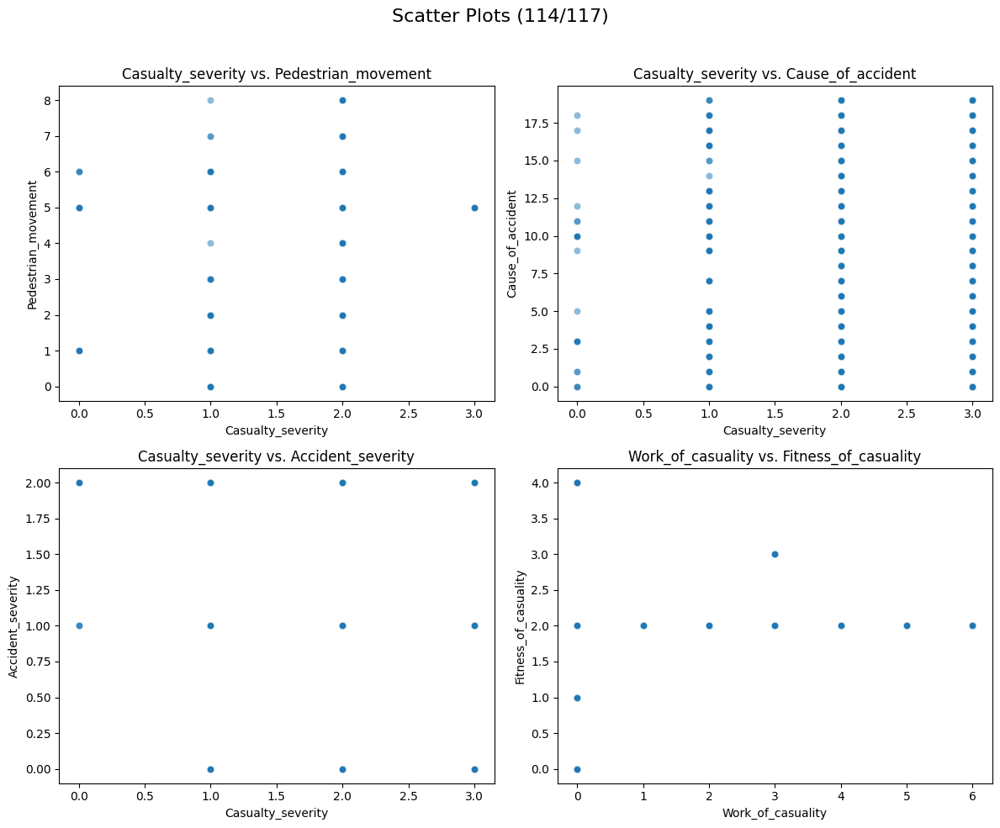

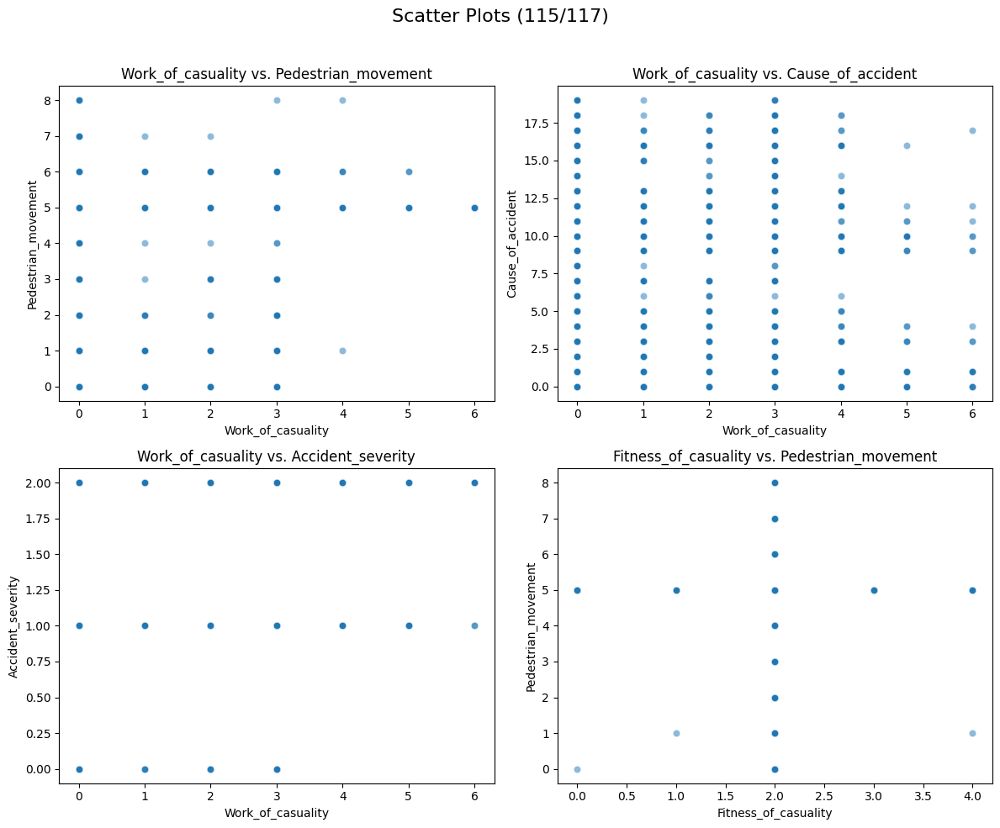

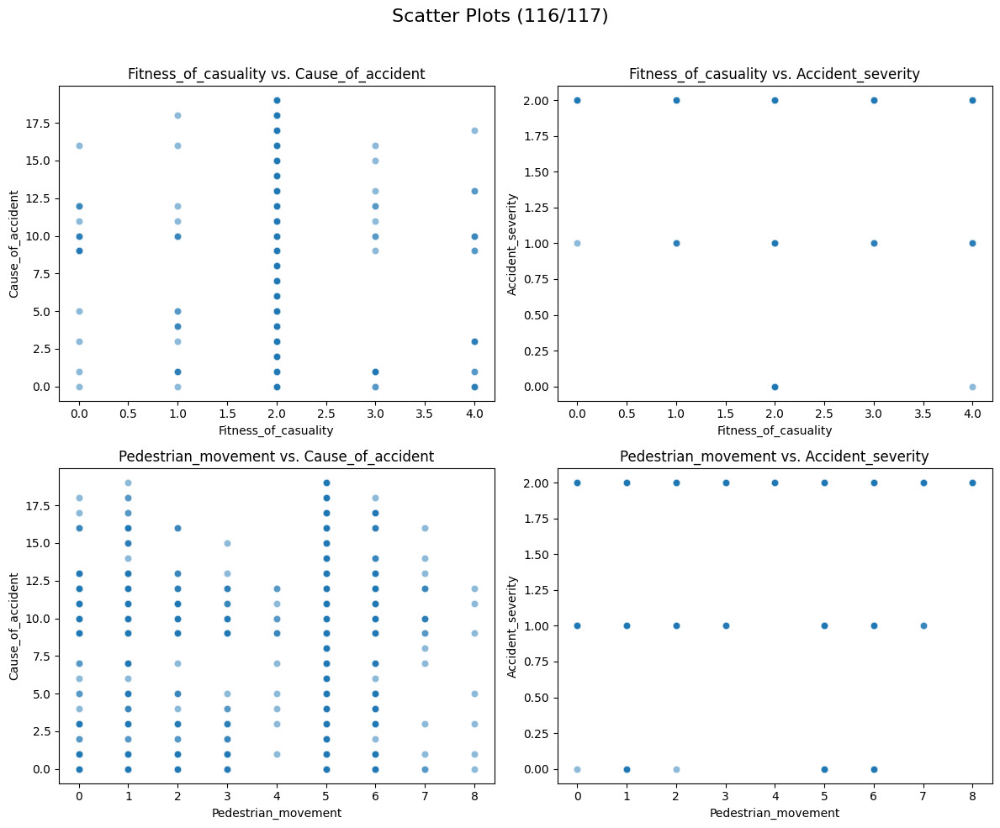

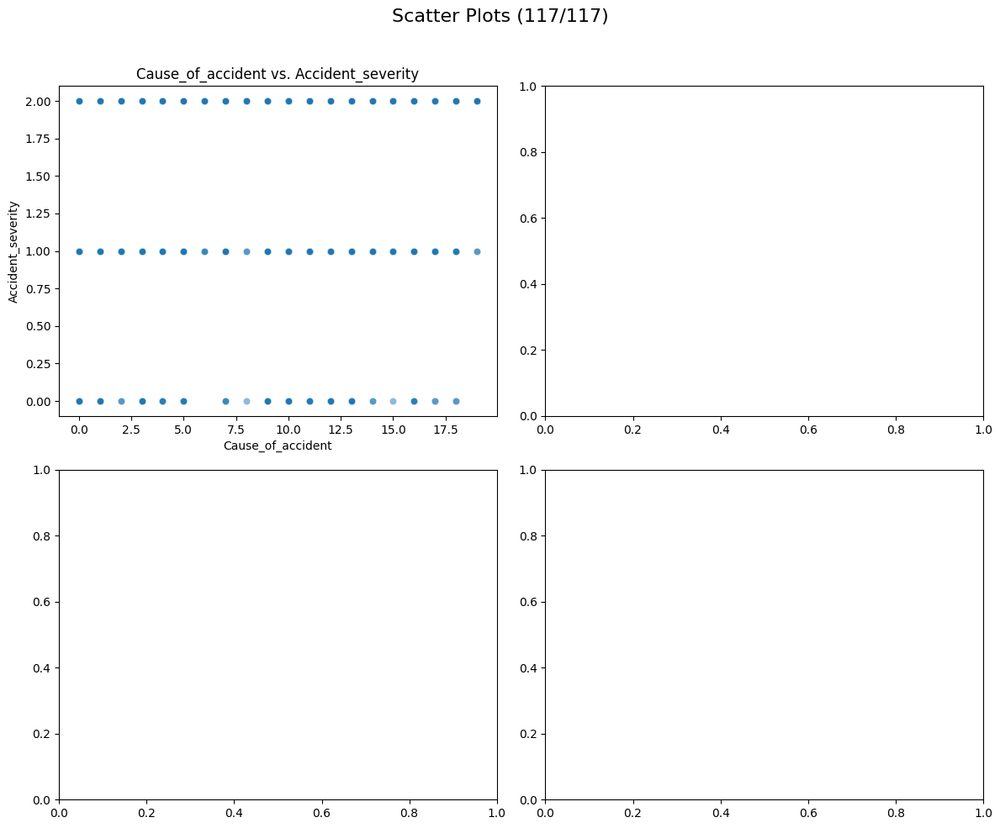

In [ ]:
import itertools
# Get numerical columns
numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

# Set the number of subplots per figure
num_plots_per_fig = 4
num_figures = len(num_pairs) // num_plots_per_fig + (len(num_pairs) % num_plots_per_fig > 0)

# Generate scatter plots in subplots
for i in range(num_figures):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 grid layout
    fig.suptitle(f"Scatter Plots ({i+1}/{num_figures})", fontsize=16)

    for j, (col1, col2) in enumerate(num_pairs[i * num_plots_per_fig : (i + 1) * num_plots_per_fig]):
        ax = axes[j // 2, j % 2]
        sns.scatterplot(x=df[col1], y=df[col2], alpha=0.5, ax=ax)
        ax.set_xlabel(col1)
        ax.set_ylabel(col2)
        ax.set_title(f"{col1} vs. {col2}")

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit title
    plt.show()

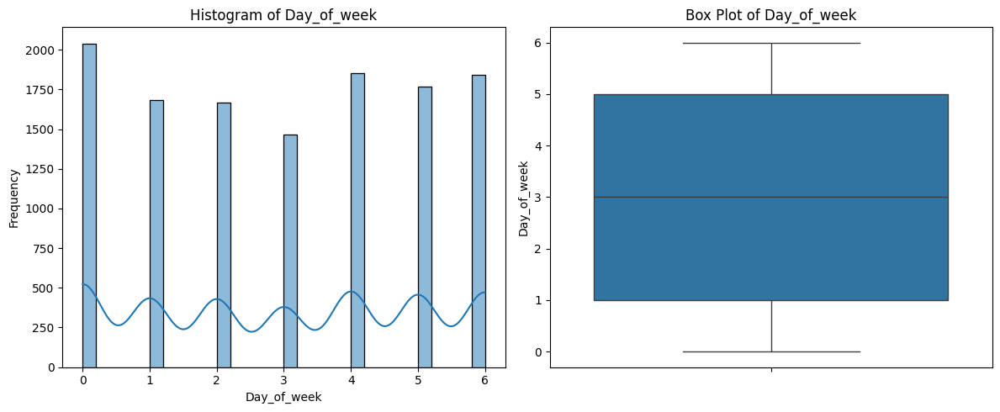

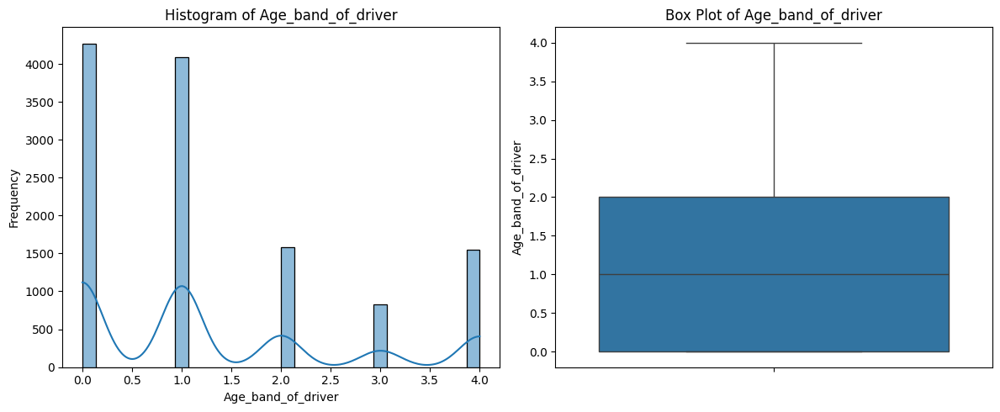

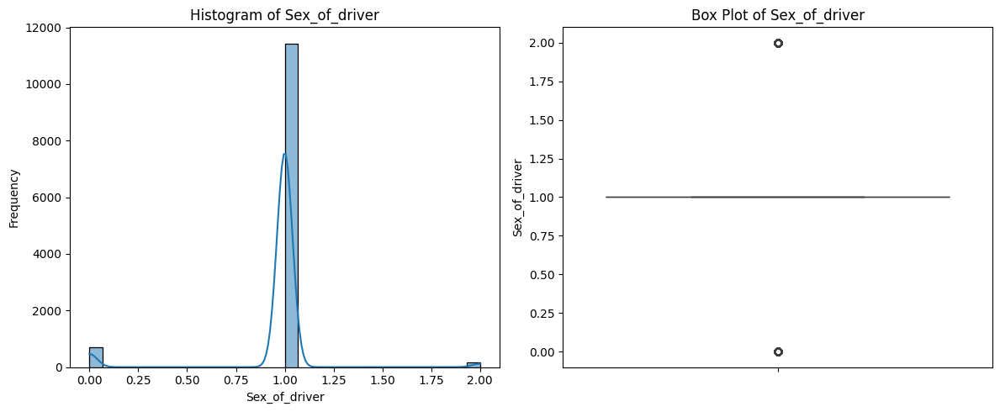

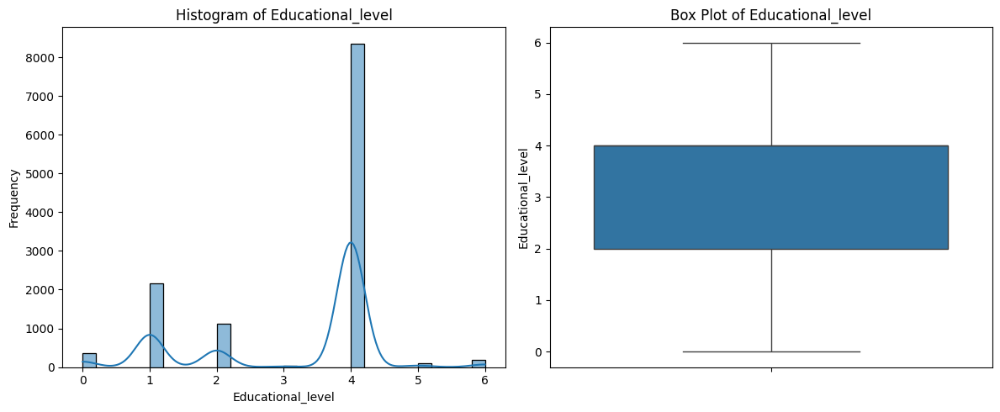

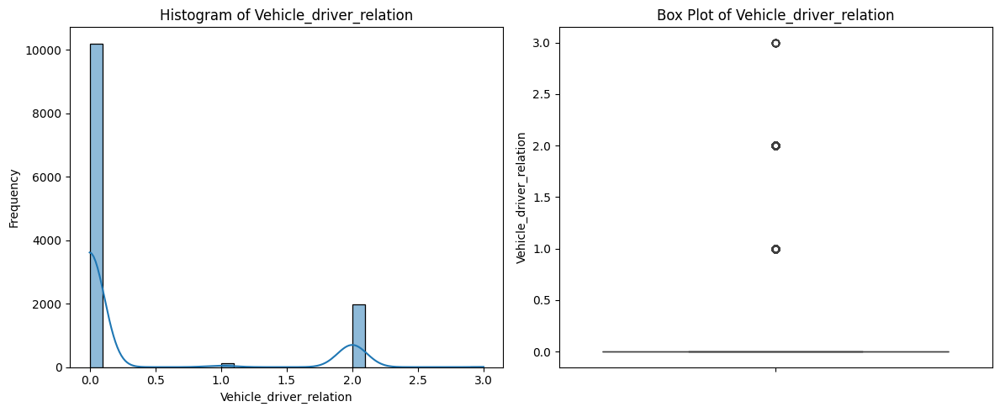

...

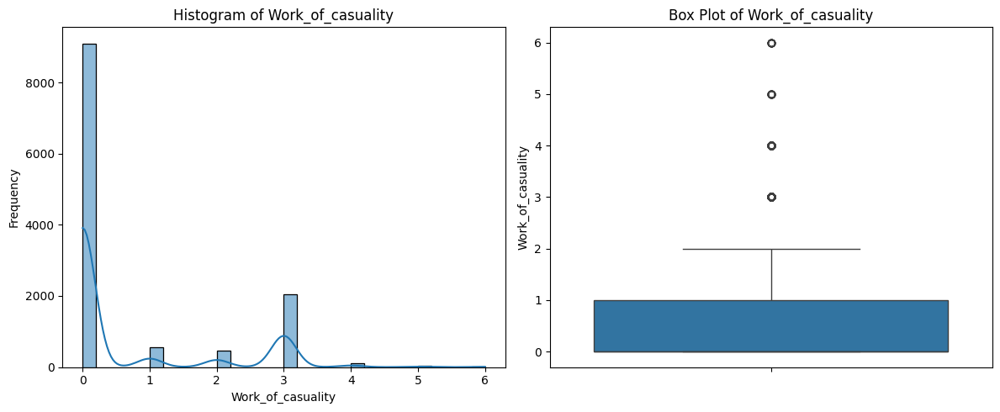

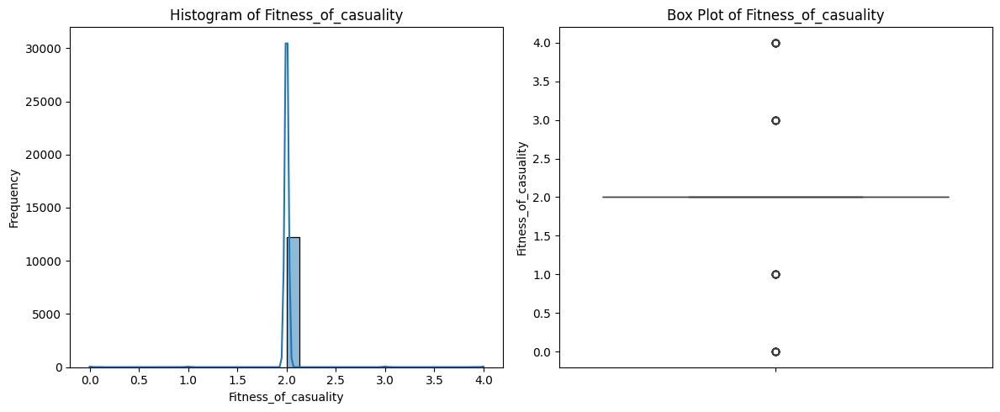

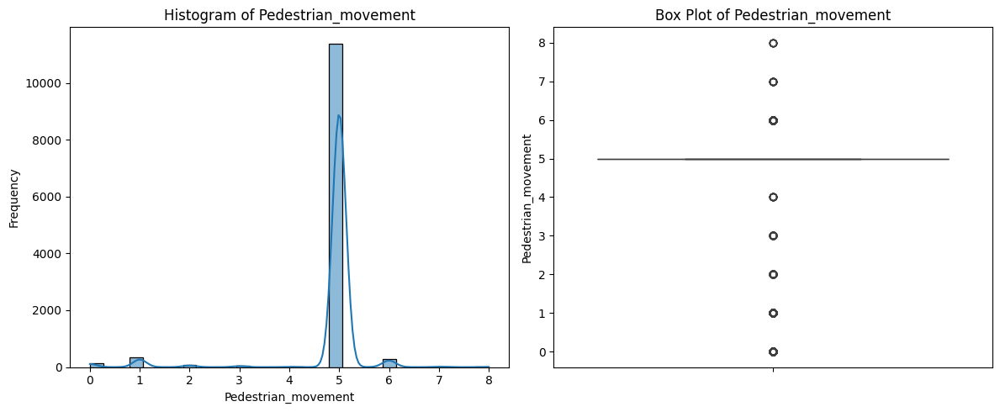

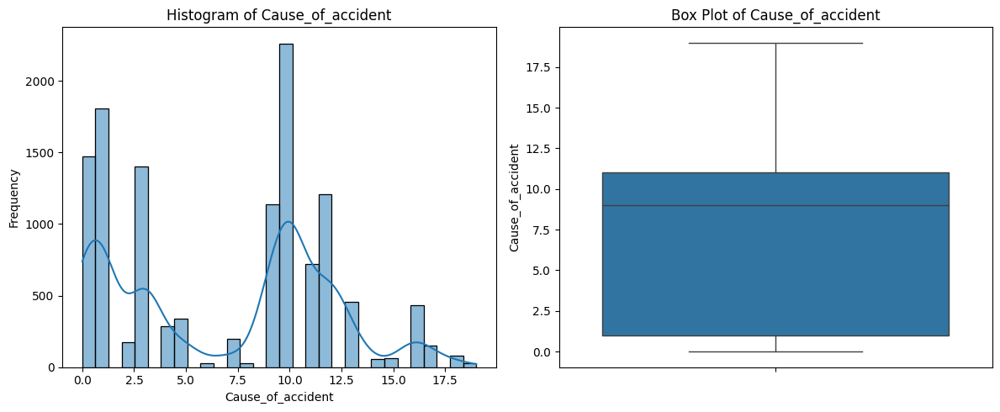

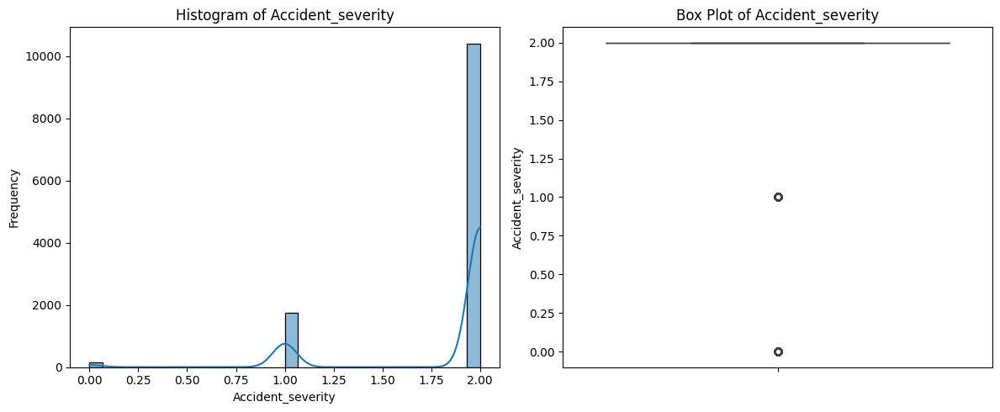

In [ ]:
# Data Visualizations for Every Column

for col in numerical_cols:
    plt.figure(figsize=(12, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], bins=30, kde=True)
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.title(f"Histogram of {col}")

    # Box Plot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[col])
    plt.ylabel(col)
    plt.title(f"Box Plot of {col}")

    plt.tight_layout()
    plt.show()


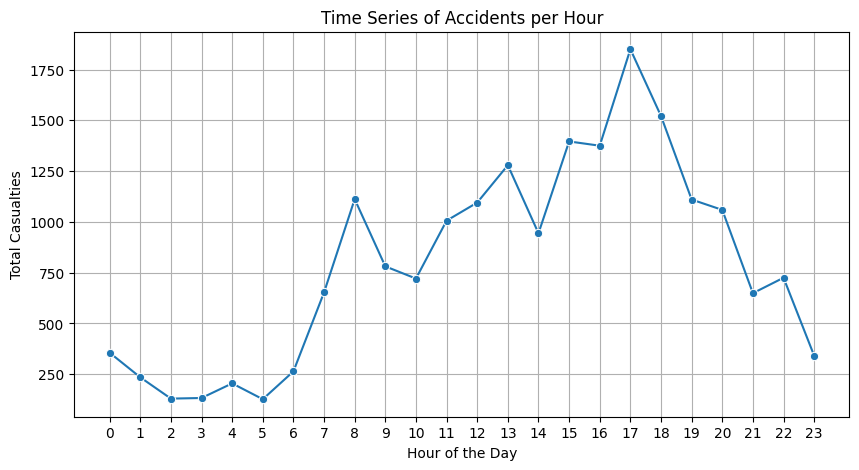

In [ ]:
# Time Series Analysis
time_series = df.groupby("Hour")["Number_of_casualties"].sum()
plt.figure(figsize=(10, 5))
sns.lineplot(x=time_series.index, y=time_series.values, marker="o")
plt.xlabel("Hour of the Day")
plt.ylabel("Total Casualties")
plt.title("Time Series of Accidents per Hour")
plt.xticks(range(0, 24))
plt.grid()
plt.show()

In [ ]:
# Machine Learning: SVM, Random Forest, Decision Tree

X = df.drop(columns=["Accident_severity"])
y = df["Accident_severity"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# SVM Model
svm_model = SVC()
svm_model.fit(X_train, y_train)
y_pred_svm = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, y_pred_svm)

# Random Forest Model
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, y_pred_rf)

# Decision Tree Model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
dt_accuracy = accuracy_score(y_test, y_pred_dt)

In [ ]:
# Model Comparison
model_comparison = pd.DataFrame({
    "Model": ["SVM", "Random Forest", "Decision Tree"],
    "Accuracy": [svm_accuracy, rf_accuracy, dt_accuracy]
})
print("\nModel Accuracy Comparison:\n", model_comparison)


Model Accuracy Comparison:
            Model  Accuracy
0            SVM  0.837662
1  Random Forest  0.840909
2  Decision Tree  0.761364


In [ ]:
# Display classification reports
print("\nSVM Classification Report:\n", classification_report(y_test, y_pred_svm))
print("\nRandom Forest Classification Report:\n", classification_report(y_test, y_pred_rf))
print("\nDecision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))



SVM Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.00      0.00      0.00       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.28      0.33      0.30      2464
weighted avg       0.70      0.84      0.76      2464


Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        37
           1       0.90      0.02      0.05       363
           2       0.84      1.00      0.91      2064

    accuracy                           0.84      2464
   macro avg       0.58      0.34      0.32      2464
weighted avg       0.84      0.84      0.77      2464


Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.35      0.32        37
           1       0.2

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

In [ ]:
# Step 1: Remove Outliers using IQR
def remove_outliers_iqr(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    return df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]

# Remove outliers only from numerical columns
df_no_outliers = remove_outliers_iqr(df.copy(), numerical_cols)
print(f"Original data shape: {df.shape}")
print(f"Data shape after removing outliers: {df_no_outliers.shape}")


Original data shape: (12316, 32)
Data shape after removing outliers: (854, 32)


In [ ]:
print("Before outlier removal:")
print(df["Accident_severity"].value_counts())

print("\nAfter outlier removal:")
print(df_no_outliers["Accident_severity"].value_counts())


Before outlier removal:
Accident_severity
2    10415
1     1743
0      158
Name: count, dtype: int64

After outlier removal:
Accident_severity
2    854
Name: count, dtype: int64


In [ ]:
# Separate features and target
target_col = "Accident_severity"
features = df.drop(columns=[target_col])
target = df[target_col]

# Remove outliers only from features
features_clean = remove_outliers_iqr(features.copy(), features.select_dtypes(include=["int64", "float64"]).columns)

# Filter target to keep rows that matched the cleaned features
target_clean = target.loc[features_clean.index]

# Reconstruct cleaned DataFrame
df_no_outliers = pd.concat([features_clean, target_clean], axis=1)

# Verify class distribution again
print("\nAfter safe outlier removal:")
print(df_no_outliers["Accident_severity"].value_counts())



After safe outlier removal:
Accident_severity
2    854
1    107
0     10
Name: count, dtype: int64


In [ ]:
# Features and target
X_clean = df_no_outliers.drop(columns=["Accident_severity"])
y_clean = df_no_outliers["Accident_severity"]

# Train/test split
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(
    X_clean, y_clean, test_size=0.2, random_state=42, stratify=y_clean)

# Scaling
scaler_clean = StandardScaler()
X_train_clean = scaler_clean.fit_transform(X_train_clean)
X_test_clean = scaler_clean.transform(X_test_clean)

# Train models
# SVM
svm_model_clean = SVC()
svm_model_clean.fit(X_train_clean, y_train_clean)
y_pred_svm_clean = svm_model_clean.predict(X_test_clean)
svm_accuracy_clean = accuracy_score(y_test_clean, y_pred_svm_clean)

# Random Forest
rf_model_clean = RandomForestClassifier()
rf_model_clean.fit(X_train_clean, y_train_clean)
y_pred_rf_clean = rf_model_clean.predict(X_test_clean)
rf_accuracy_clean = accuracy_score(y_test_clean, y_pred_rf_clean)

# Decision Tree
dt_model_clean = DecisionTreeClassifier()
dt_model_clean.fit(X_train_clean, y_train_clean)
y_pred_dt_clean = dt_model_clean.predict(X_test_clean)
dt_accuracy_clean = accuracy_score(y_test_clean, y_pred_dt_clean)

# Compare
model_comparison_clean = pd.DataFrame({
    "Model": ["SVM", "Random Forest", "Decision Tree"],
    "Accuracy (Cleaned)": [svm_accuracy_clean, rf_accuracy_clean, dt_accuracy_clean]
})
print("\nModel Accuracy After Outlier Removal:\n", model_comparison_clean)



Model Accuracy After Outlier Removal:
            Model  Accuracy (Cleaned)
0            SVM            0.882051
1  Random Forest            0.882051
2  Decision Tree            0.758974


In [ ]:
from sklearn.metrics import classification_report

# Classification Reports
print("\nSVM Classification Report (After Outlier Removal):")
print(classification_report(y_test_clean, y_pred_svm_clean))

print("\nRandom Forest Classification Report (After Outlier Removal):")
print(classification_report(y_test_clean, y_pred_rf_clean))

print("\nDecision Tree Classification Report (After Outlier Removal):")
print(classification_report(y_test_clean, y_pred_dt_clean))



SVM Classification Report (After Outlier Removal):
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00        21
           2       0.88      1.00      0.94       172

    accuracy                           0.88       195
   macro avg       0.29      0.33      0.31       195
weighted avg       0.78      0.88      0.83       195


Random Forest Classification Report (After Outlier Removal):
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00        21
           2       0.88      1.00      0.94       172

    accuracy                           0.88       195
   macro avg       0.29      0.33      0.31       195
weighted avg       0.78      0.88      0.83       195


Decision Tree Classification Report (After Outlier Removal):
              precision    recall  f1-score   support

       

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m